# Introduction

**ASSIGNMENT DEADLINE: 30 October 2019 (Thursday)**

$\textbf{Exercise 5: Tracking}$

- In this assignment, your task is to implement the "mean_shift" and "Lucas-Kanad optical flow" tracking algorithms for the video tracking task.
- Implement all operation in motion.py file.
- Submit the notebook along with outputs stored in the output/ directory
- You can call functions implemented outside of the marked coding block. But do not change existing functions, e.g., rename the function or delete some functions. Do not change the folder structure, e.g., rename the files or delete some files;

In [2]:
# Setup
from __future__ import print_function

import numpy as np
from skimage import filters
from skimage.feature import corner_peaks
import matplotlib.pyplot as plt
from matplotlib import rc
from IPython.display import HTML

%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

## 0. Displaying Video
For this assignment, the videos are provided as time series of images. We also provide utility functions to load the image frames and visualize them as a short video clip.

*Note: You may need to install video codec like [FFmpeg](http://ffmpeg.zeranoe.com/builds/). For Linux/Mac, you will be able to install ffmpeg using `apt-get` or `brew`. For Windows, you can find the installation instructions [here](https://www.wikihow.com/Install-FFmpeg-on-Windows).*

c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\io\_io.py:49: UserWarning: `as_grey` has been deprecated in favor of `as_gray`
  warn('`as_grey` has been deprecated in favor of `as_gray`')


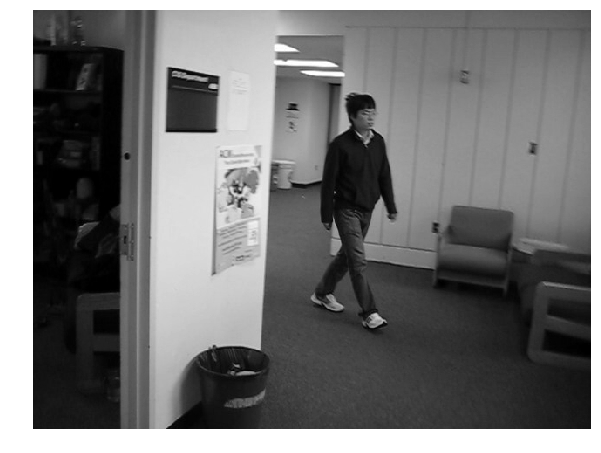

In [3]:
from utils import animated_frames, load_frames

# Load frames
frames = load_frames("BlurBody/img2/")
ani = animated_frames(frames)
HTML(ani.to_html5_video())

## 1. Meanshift for tracking objects in videos

### 1.1 Mean shift background
The intuition behind the meanshift is simple. Consider you have a set of points. (It can be a pixel distribution like histogram backprojection). You are given a small window (may be a circle) and you have to move that window to the area of maximum pixel density (or maximum number of points). It is illustrated in the simple image given below:
![title](meanshift_basics.jpg)

The initial window is shown in blue circle with the name "C1". Its original center is marked in blue rectangle, named "C1_o". But if you find the centroid of the points inside that window, you will get the point "C1_r" (marked in small blue circle) which is the real centroid of the window. Surely they don't match. So move your window such that the circle of the new window matches with the previous centroid. Again find the new centroid. Most probably, it won't match. So move it again, and continue the iterations such that the center of window and its centroid falls on the same location (or within a small desired error). So finally what you obtain is a window with maximum pixel distribution. It is marked with a green circle, named "C2". As you can see in the image, it has maximum number of points. The whole process is demonstrated on a static image below:
![title](meanshift_face.gif)
So we normally pass the histogram backprojected image and initial target location. When the object moves, obviously the movement is reflected in the histogram backprojected image. As a result, the meanshift algorithm moves our window to the new location with maximum density.

### 1.2 An actual object tracker by using the mean shift

334


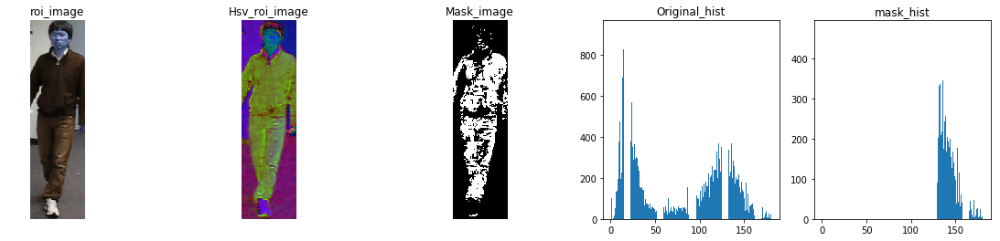

In [4]:
from motion import *
import cv2
plt.rcParams['figure.figsize'] = (20, 4) #set default size of plots

path = "BlurBody/img2/"
list_image = []
list_image = listdir(path,list_image)
print(len(list_image))

frame1 = cv2.imread(list_image[0])
x, y, w, h = 400,48,87,319 # Blur body
track_window = (x,y,w,h)
roi = frame1[y:y+h,x:x+w]

hsv_roi = cv2.cvtColor(roi,cv2.COLOR_BGR2HSV)
#####################################################
# You may modify the code below to use the params you
# define above.
thresh_value1 = 120.
thresh_value2 = 20.
channel = 1
#####################################################
mask = cv2.inRange(hsv_roi,np.array((0.,thresh_value1,thresh_value2,)),np.array((180.,255.,255.,))) # Blur body
roi_hist = cv2.calcHist([hsv_roi],[channel],mask,[180],[0,180])
roi_hist1 = cv2.calcHist([hsv_roi],[channel],None,[180],[0,180])


plt.subplot(1,5,1)
plt.imshow(roi)
plt.axis('off')
plt.title('roi_image')

plt.subplot(1,5,2)
plt.imshow(hsv_roi)
plt.axis('off')
plt.title('Hsv_roi_image')

plt.subplot(1,5,3)
plt.imshow(mask)
plt.axis('off')
plt.title('Mask_image')

plt.subplot(1,5,4)
y1 = np.squeeze(roi_hist1)
y1 =list(y1)
x1 = list(range(1,181,1))
plt.title("Original_hist")
plt.bar(x1,y1)

plt.subplot(1,5,5)
y1 = np.squeeze(roi_hist)
y1 =list(y1)
x1 = list(range(1,181,1))
plt.title("mask_hist")
plt.bar(x1,y1)
plt.show()

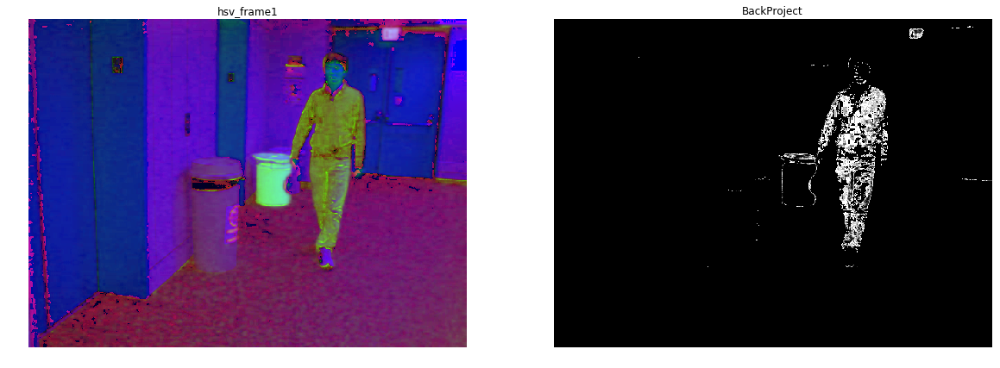

In [5]:
frame1 = cv2.imread(list_image[0])
hsv_frame1 = cv2.cvtColor(frame1,cv2.COLOR_BGR2HSV)
dst = cv2.calcBackProject([hsv_frame1],[channel],roi_hist,[0,180],1)

plt.rcParams['figure.figsize'] = (20, 10)

plt.subplot(1,2,1)
plt.imshow(hsv_frame1)
plt.axis('off')
plt.title('hsv_frame1')

plt.subplot(1,2,2)
plt.imshow(dst)
plt.axis('off')
plt.title('BackProject')
plt.show()


334


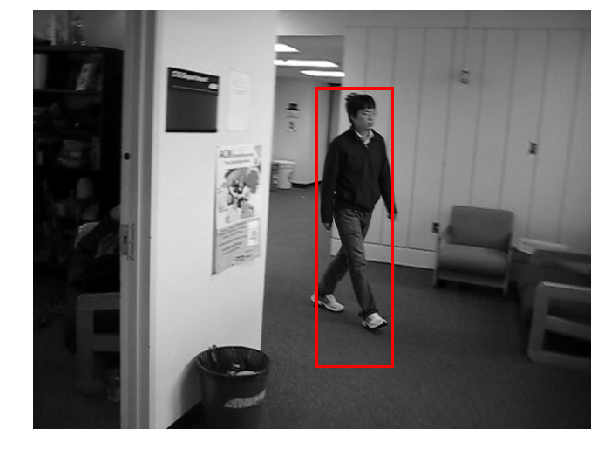

In [6]:
from motion import meanShift,listdir
from utils import *
#import numpy as np 
# Initailze bounding box
bboxes = []
path = "BlurBody/img2/"
x, y, w, h = 400,48,87,319 # Blur body
track_window = (x,y,w,h)
list_image = []
list_image = listdir(path,list_image)
print(len(list_image)) 
for i in range(len(list_image)):
    frame = cv2.imread(list_image[i])
    hsv = cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    dst = cv2.calcBackProject([hsv],[channel],roi_hist,[0,180],1)
    c = np.reshape(dst,(-1,1))
    
    #aplly meanshift to get the new location
    track_window = meanShift(dst,track_window,max_iter=100,stop_thresh=0.001)
    x,y,w,h = track_window
    bboxes.append((x,y,w,h))

ani = animated_bbox(frames, bboxes)
HTML(ani.to_html5_video())

### 1.3 Evaluating Object Tracker: intersection over union (IoU)
Intersection over union is a common metric for evaluating performance of an object tracker. Implement `IoU` in `motion.py` to evaluate our object tracker. You will full marks for IoU score > 0.65.

In [7]:
import sys
np.set_printoptions(threshold=sys.maxsize)

In [8]:
from motion import IoU
#load the graound_truth 

ground_path = "BlurBody/groundtruth_rect.txt"
f = open(ground_path)
gt_bboxes = []
ground_truth = f.readlines()
print(len(ground_truth))
for i in range(len(ground_truth)):
    x = int(ground_truth[i].split()[0])
    y = int(ground_truth[i].split()[1])
    w = int(ground_truth[i].split()[2])
    h = int(ground_truth[i].split()[3])
    gt_bboxes.append((x,y,w,h))
#calculate the IOU
average_iou = 0.0
for gt_bbox, bbox in zip(gt_bboxes, bboxes):
    average_iou += IoU(gt_bbox, bbox)
    
average_iou /= len(gt_bboxes)
print(average_iou)

334
0.6831825457280492


## 2. Lucas-Kanade Method for Optical Flow

### 2.1 Deriving optical flow equation
Optical flow methods are used to estimate motion of objects between two consecutive image frames. For example, in the video below, the can of tea seems to be moving to the left. For our system to be able to understand that the can is moving to the left, it would be useful to find a way to add vectors to the can (known as **flow vectors**) which point to the left, thus describing its motion.

Given two consecutive frames, how can we find the flow vectors for the first frame which describe how objects move between frames? To start, we make a reasonable assumption called the **brightness constancy** assumption: the pixel intensity of a moving point stays the same between two consecutive frames with small time difference. In other words, picking any pixel of the moving can, its brightness stays approximately the same between frames--its movement should not affect its brightness after all.

Consider pixel intensity (a.k.a. brightness) $I(x, y, t)$ of a point $(x, y)$ in the first frame $t$. Suppose that the point has moved to $(x+\Delta{x}, y+\Delta{y})$ after $\Delta{t}$. According to the brightness constancy assumption, we can relate intensities of the point in the two frames using the following equation:

$$
I(x,y,t)=I(x+\Delta{x},y+\Delta{y},t+\Delta{t})
$$

Coming back to the example of the moving can, this equation simply states that the point that we picked will have the same intensity even after it moves in space $(\Delta{x}$ and $\Delta{y})$ and between frames $(\Delta{t})$. From this simple assumption, we can derive what is known as the **optical flow equation**. For a given point for any frame, the optical flow equation is given by:

$$
I_x({\mathbf{p}})v_{x} +
I_y({\mathbf{p}})v_{y} +
I_t({\mathbf{p}})
= 0
$$

Here, $I_x$, $I_y$ and $I_t$ are partial derivatives of pixel intensity $I$. Meanwhile,
$v_{x}$ and $v_{y}$ are **flow vectors** in the $x-$ and $y-$direction, respectively. These are the vectors we care about! If we can solve for these two values, we will be able to describe the motion of any object between frames.


c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\io\_io.py:49: UserWarning: `as_grey` has been deprecated in favor of `as_gray`
  warn('`as_grey` has been deprecated in favor of `as_gray`')


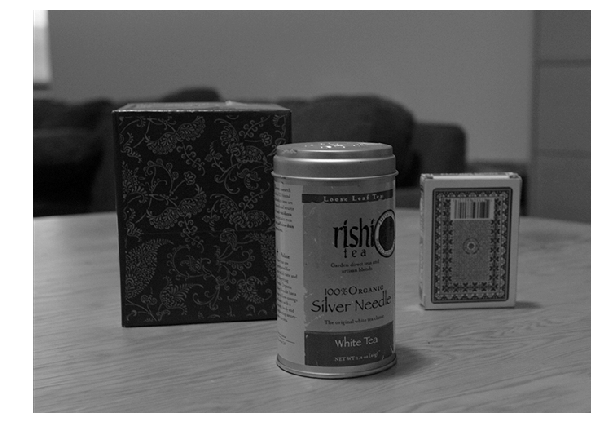

In [9]:
# Load frames
frames = load_frames("images2/")
ani = animated_frames(frames)
HTML(ani.to_html5_video())

### 2.2 Overview of Lucas-Kanade method

One issue with the optical flow equation is that there are two unknowns that we want to solve for ($v_x$ and $v_y$). This problem is known as the **aperture problem**. In other words, just looking an "aperture" at one pixel at a time, it is impossible to discern the true direction of motion of the object in question.

The Lucas–Kanade method solves this problem by adding another assumption: **spatial coherence**. That is, that the motion of the image contents between two frames is approximately constant within a neighborhood of the point $p$ under consideration.

Consider a neighborhood of $p$, $N(p)=\{p_1,...,p_n\}$ (e.g. 3x3 window around $p$). Adding the spatial coherence assumption to the optical flow equation, we see that the following should be satisfied:

For every $p_i \in N(p)$,
$$
I_{x}(p_i)v_x + I_{y}(p_i)v_y = -I_{t}(p_i)
$$

These equations can be written in matrix form $Av=b$, where

$$
A = 
\begin{bmatrix}
    I_{x}(p_1) & I_{y}(p_1)\\
    I_{x}(p_2) & I_{y}(p_2)\\
    \vdots & \vdots\\
    I_{x}(p_n) & I_{y}(p_n)
\end{bmatrix}
\quad
v =
\begin{bmatrix}
    v_{x}\\
    v_{y}
\end{bmatrix}
\quad
b =
\begin{bmatrix}
    -I_{t}(p_1)\\
    -I_{t}(p_2)\\
    \vdots\\
    -I_{t}(p_n)
\end{bmatrix}
$$

We can now solve for the flow vectors (now represented as $v$) by solving the following least-squares problem: $A^{T}Av=A^{T}b$.

### 2.3 Implementation of Lucas-Kanade method

In this section, we are going to implement basic Lucas-Kanade method for feature tracking. In order to do so, we first need to find keypoints to track. Harris corner detector is commonly used to initialize the keypoints to track with Lucas-Kanade method. For this assignment, we are going to use [`skimage` implementation](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_corner.html) of Harris corner detector.

c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\io\_io.py:49: UserWarning: `as_grey` has been deprecated in favor of `as_gray`
  warn('`as_grey` has been deprecated in favor of `as_gray`')


13
(494, 685)


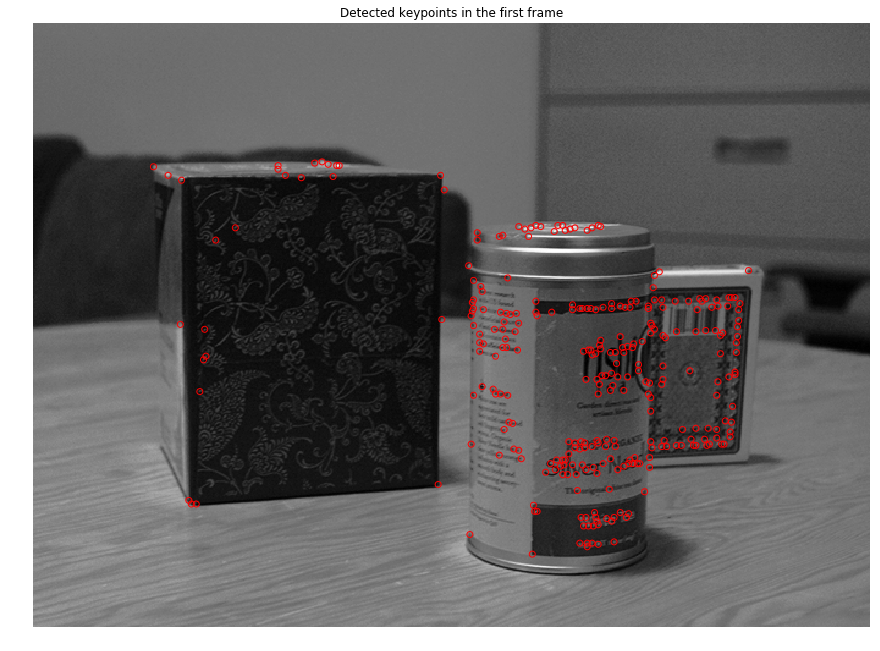

In [10]:
from skimage import filters
from skimage.feature import corner_harris, corner_peaks

frames = load_frames('images2')
print(len(frames))
print(frames[0].shape)

# Detect keypoints to track
keypoints = corner_peaks(corner_harris(frames[0]),
                         exclude_border=5,
                         threshold_rel=0.01)

# Plot kepoints
plt.figure(figsize=(15,12))
plt.imshow(frames[0])
plt.scatter(keypoints[:,1], keypoints[:,0],
            facecolors='none', edgecolors='r')
plt.axis('off')
plt.title('Detected keypoints in the first frame')
plt.show()

Implement function **`lucas_kanade`** in `motion.py` and run the code cell below. You will be able to see small arrows pointing towards the directions where keypoints are moving.

(295, 2) (295, 2)


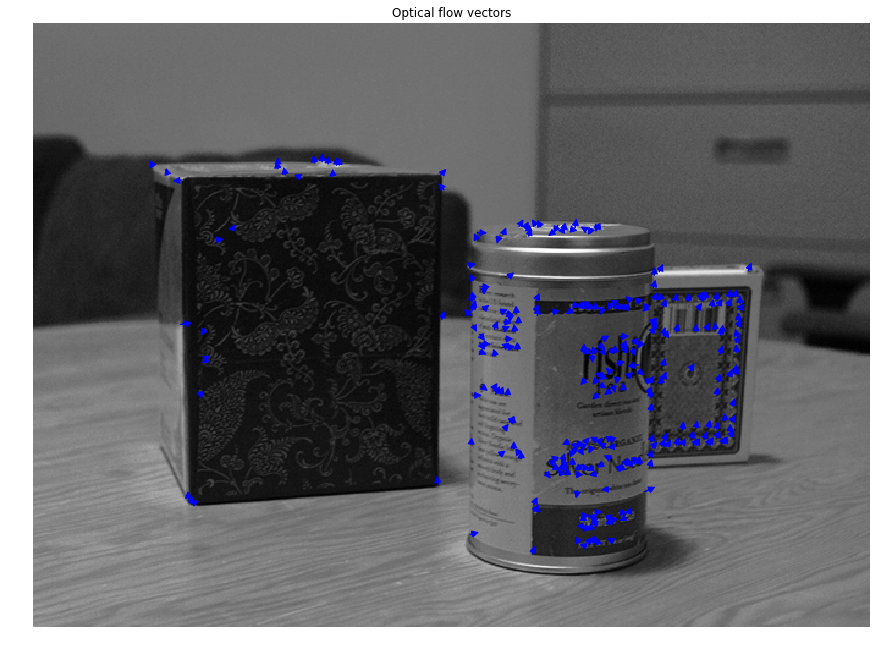

In [40]:
from motion import lucas_kanade

# Lucas-Kanade method for optical flow
flow_vectors = lucas_kanade(frames[0], frames[1], keypoints, window_size=5)

# Plot flow vectors
plt.figure(figsize=(15,12))
plt.imshow(frames[0])
plt.axis('off')
plt.title('Optical flow vectors')

print(keypoints.shape,flow_vectors.shape)
for y, x, vy, vx in np.hstack((keypoints, flow_vectors)):
    plt.arrow(x, y, vx, vy, head_width=5, head_length=5, color='b')
    

We can estimate the position of the keypoints in the next frame by adding the flow vectors to the keypoints.

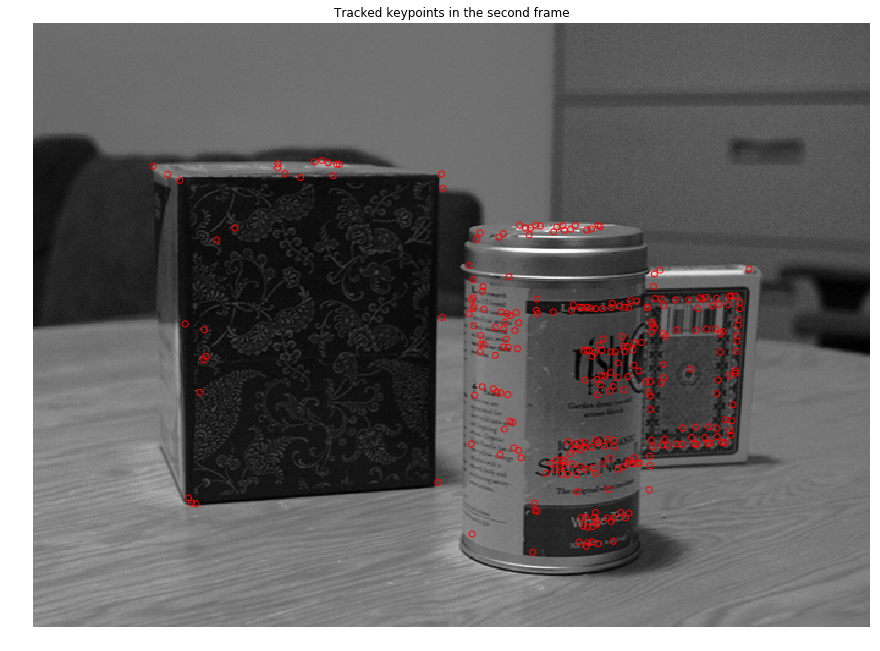

In [12]:
# Plot tracked kepoints
new_keypoints = keypoints + flow_vectors
plt.figure(figsize=(15,12))
plt.imshow(frames[1])
plt.scatter(new_keypoints[:,1], new_keypoints[:,0],
            facecolors='none', edgecolors='r')
plt.axis('off')
plt.title('Tracked keypoints in the second frame')
plt.show()

### 2.4 Feature Tracking in multiple frames
Now we can use Lucas-Kanade method to track keypoints across multiple frames. The idea is simple: compute flow vectors at keypoints in $i$-th frame, and add the flow vectors to the points to keep track of the points in $i+1$-th frame. We have provided the function `track_features` for you. First, run the code cell below. You will notice that some of the points just drift away and are not tracked very well.

Instead of keeping these 'bad' tracks, we would want to somehow declare some points are 'lost' and just discard them. One simple way to is to compare the patches around tracked points in two subsequent frames. If the patch around a point is NOT similar to the patch around the corresponding point in the next frame, then we declare the point to be lost. Here, we are going to use mean squared error between two normalized patches as the criterion for lost tracks.

Implement **`compute_error`** in `motion.py`, and re-run the code cell below. You will see many of the points disappearing in later frames.

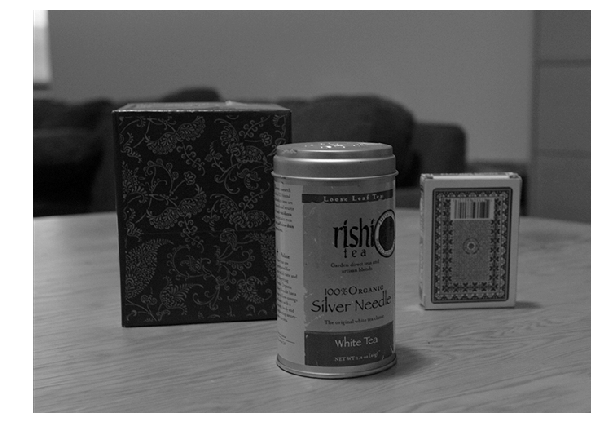

In [61]:
from utils import animated_scatter
from motion import track_features
# Detect keypoints to track in the first frame
keypoints = corner_peaks(corner_harris(frames[0]),
                         exclude_border=5,
                         threshold_rel=0.01)

trajs = track_features(frames, keypoints,
                       error_thresh=1.5,
                       optflow_fn=lucas_kanade,
                       window_size=5)
ani = animated_scatter(frames,trajs)
ani.save("images2_my.mp4")
HTML(ani.to_html5_video())

## 3. Pyramidal Lucas-Kanade Feature Tracker
In this section, we are going to implement a simpler version of the method described in ["Pyramidal Implementation of the Lucas Kanade Feature Tracker"](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.185.585&rep=rep1&type=pdf).

### 3.1 Iterative Lucas-Kanade method
One limitation of the naive Lucas-Kanade method is that it cannot track large motions between frames. You might have noticed that the resulting flow vectors (blue arrows) in the previous section are too small that the tracked keypoints are slightly off from where they should be. In order to address this problem, we can iteratively refine the estimated optical flow vectors. Below is the step-by-step description of the algorithm:

Let $p=\begin{bmatrix}p_x & p_y \end{bmatrix}^T$ be a point on frame $I$. The goal is to find flow vector $v=\begin{bmatrix}v_x & v_y \end{bmatrix}^T$ such that $p+v$ is the corresponding point of $p$ on the next frame $J$.

- Initialize flow vector:
$$
v=
\begin{bmatrix}
    0\\0
\end{bmatrix}
$$

- Compute spatial gradient matrix:
$$
G=\sum_{x=p_x-w}^{p_x+w}\sum_{y=p_y-w}^{p_y+w}
\begin{bmatrix}
    I_{x}^2(x,y) & I_{x}(x,y)I_{y}(x,y)\\
    I_{x}(x,y)I_{y}(x,y) & I_{y}^2(x,y)
\end{bmatrix}
$$

- **for $k=1$ to $K$**
    - Compute temporal difference: $\delta I_k(x, y) = I(x,y)-J(x+g_x+v_x, y+g_y+v_y)$
    - Compute image mismatch vector:
$$
b_k=\sum_{x=p_x-w}^{p_x+w}\sum_{y=p_y-w}^{p_y+w}
\begin{bmatrix}
    \delta I_k(x, y)I_x(x,y)\\
    \delta I_k(x, y)I_y(x,y)
\end{bmatrix}
$$
    - Compute optical flow: $v^k=G^{-1}b_k$
    - Update flow vector for next iteration: $v := v + v^k$


- Return $v$

Implement `iterative_lucas_kanade` method in `motion.py` and run the code cell below. You should be able to see slightly longer arrows in the visualization.

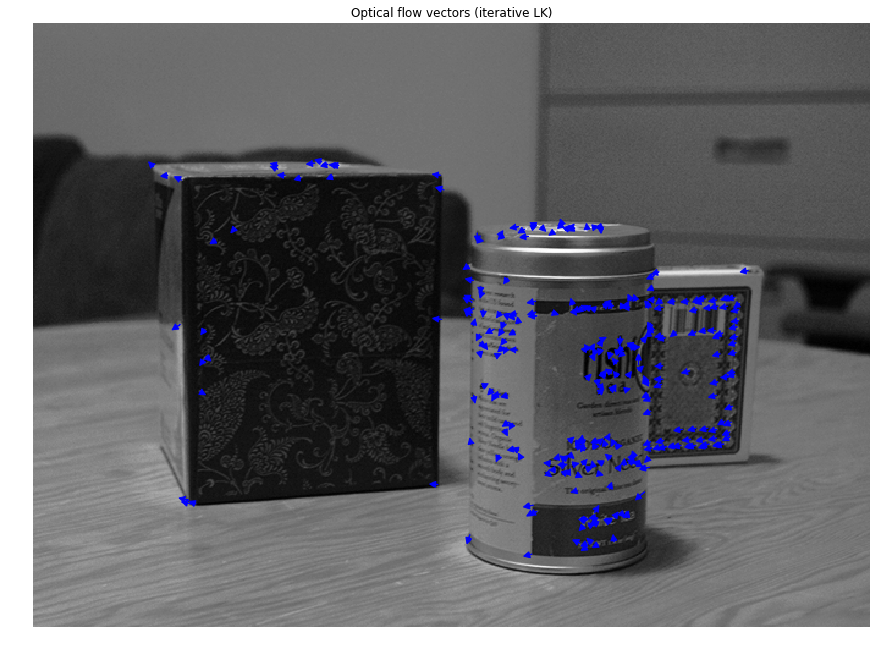

In [62]:
from motion import iterative_lucas_kanade

# Run iterative Lucas-Kanade method
flow_vectors = iterative_lucas_kanade(frames[0], frames[1], keypoints)

# Plot flow vectors
plt.figure(figsize=(15,12))
plt.imshow(frames[0])
plt.axis('off')
plt.title('Optical flow vectors (iterative LK)')

for y, x, vy, vx in np.hstack((keypoints, flow_vectors)):
    plt.arrow(x, y, vx, vy, head_width=5, head_length=5, color='b')

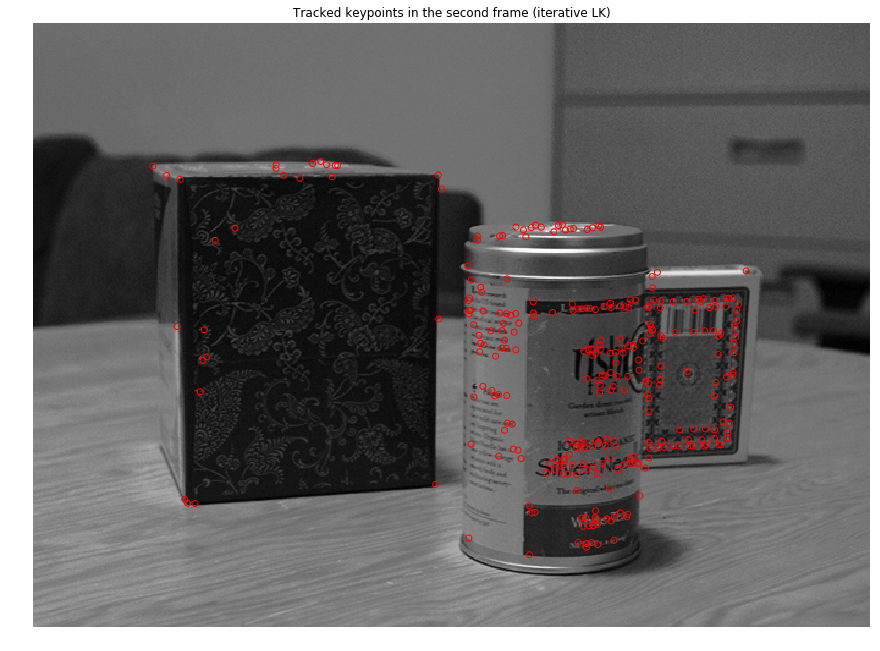

In [63]:
# Plot tracked kepoints
new_keypoints = keypoints + flow_vectors
plt.figure(figsize=(15,12))
plt.imshow(frames[1])
plt.scatter(new_keypoints[:,1], new_keypoints[:,0],
            facecolors='none', edgecolors='r')
plt.axis('off')
plt.title('Tracked keypoints in the second frame (iterative LK)')
plt.show()

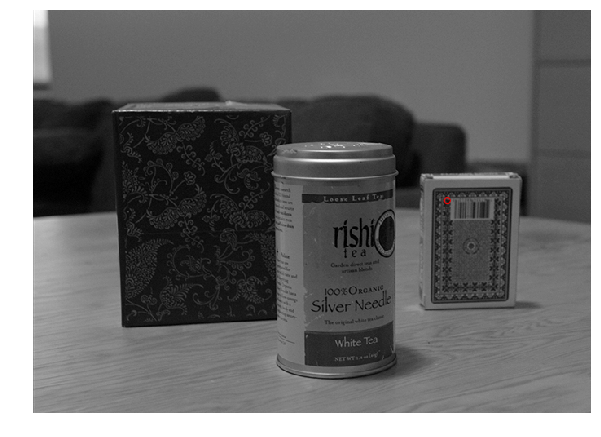

In [64]:
# Detect keypoints to track in the first frame
keypoints = corner_peaks(corner_harris(frames[0]),
                         exclude_border=5,
                         threshold_rel=0.01)

# Track keypoints using iterative Lucas-Kanade method
trajs = track_features(frames, keypoints,
                       error_thresh=1.5,
                       optflow_fn=iterative_lucas_kanade,
                       window_size=5)
ani = animated_scatter(frames,trajs)
#ani.save("images2_itera.mp4")
HTML(ani.to_html5_video())

### 3.2 Coarse-to-Fine Optical Flow
The iterative method still could not track larger motions. If we downscaled the images, larger displacements would become easier to track. On the otherhand, smaller motions would become more difficult to track as we lose details in the images. To address this problem, we can represent images in multi-scale, and compute flow vectors from coarse to fine scale.

Run the following code cell to visualize image pyramid.

c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


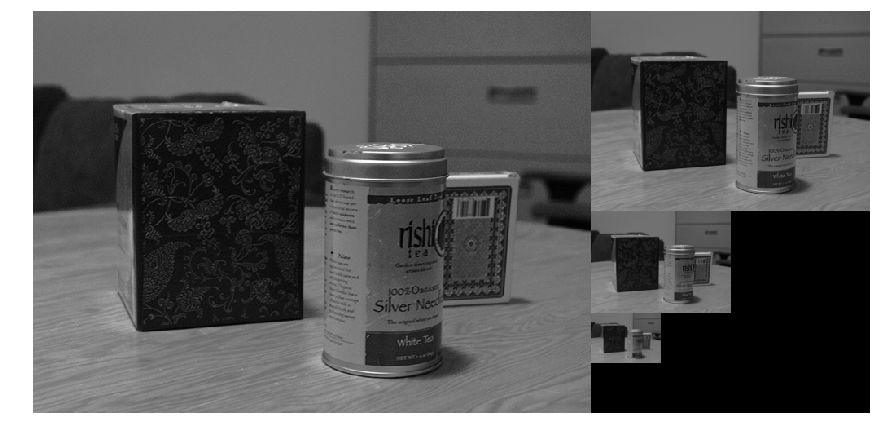

In [65]:
from skimage.transform import pyramid_gaussian

image = frames[0]

# pyramid_gaussian returns tuple of max_layer + 1 images in multiple scales
pyramid = tuple(pyramid_gaussian(image, max_layer=3, downscale=2))

rows, cols = image.shape
composite_image = np.zeros((rows, cols + cols // 2 + 1), dtype=np.double)
composite_image[:rows, :cols] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

# Display image pyramid
plt.figure(figsize=(15,12))
plt.imshow(composite_image)
plt.axis('off')
plt.show()

Following is the description of pyramidal Lucas-Kanade algorithm:

Let $p$ be a point on image $I$ and $s$ be the scale of pyramid representation.
- Build pyramid representations of $I$ and $J$: $\{I^L\}_{L=0,...,L_m}$ and $\{J^L\}_{L=0,...,L_m}$


- Initialize pyramidal guess $g^{L_m}=
\begin{bmatrix}g_{x}^{L_m} & g_{y}^{L_m}\end{bmatrix}^T=\begin{bmatrix}0 & 0\end{bmatrix}^T$


- **for $L=L_m$ to $0$ with step of -1**

    - Compute location of $p$ on $I^L$: $p^L=p/s^L$
    
    - Let $d^L$ be the optical flow vector at level $L$:
$$
d^L := IterativeLucasKanade(I^L, J^L, p^L, g^L)
$$
    - Guess for next level $L-1$: $g^{L-1}=s(g^L+d^L)$
    
    
- Return $d=g^0+d^0$

Implement `pyramid_lucas_kanade`.

c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


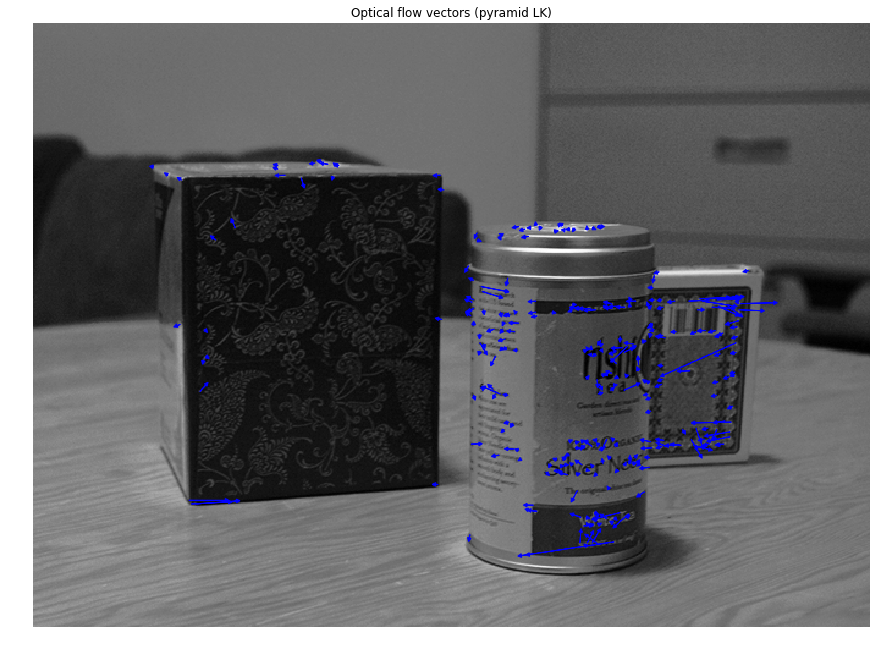

In [66]:
from motion import pyramid_lucas_kanade

# Lucas-Kanade method for optical flow
flow_vectors = pyramid_lucas_kanade(frames[0], frames[1], keypoints)
# Plot flow vectors
plt.figure(figsize=(15,12))
plt.imshow(frames[0])
plt.axis('off')
plt.title('Optical flow vectors (pyramid LK)')

for y, x, vy, vx in np.hstack((keypoints, flow_vectors)):
    plt.arrow(x, y, vx, vy, head_width=3, head_length=3, color='b')

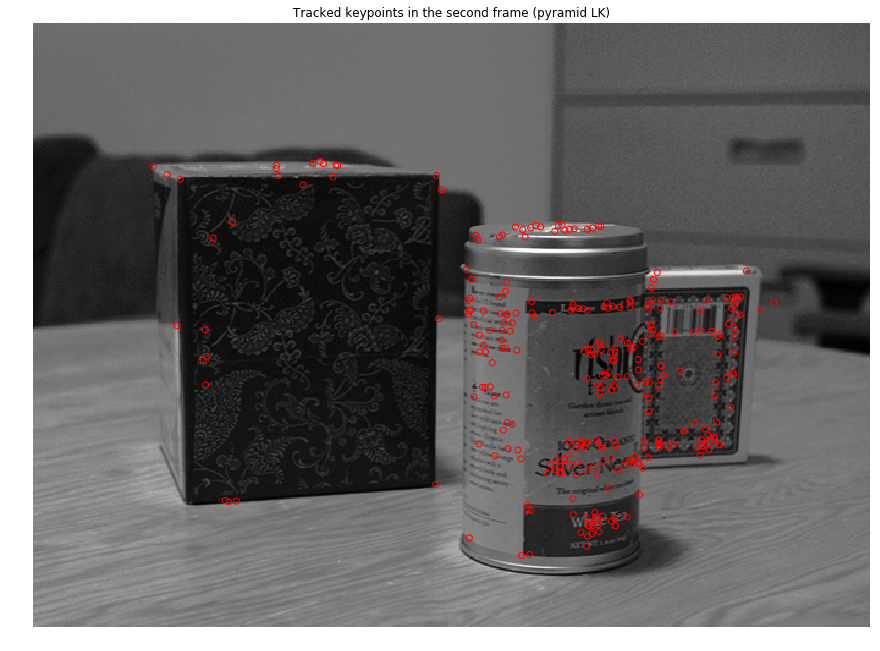

In [67]:
# Plot tracked kepoints
new_keypoints = keypoints + flow_vectors
plt.figure(figsize=(15,12))
plt.imshow(frames[1])
plt.scatter(new_keypoints[:,1], new_keypoints[:,0],
            facecolors='none', edgecolors='r')
plt.axis('off')
plt.title('Tracked keypoints in the second frame (pyramid LK)')

plt.show()

c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel 

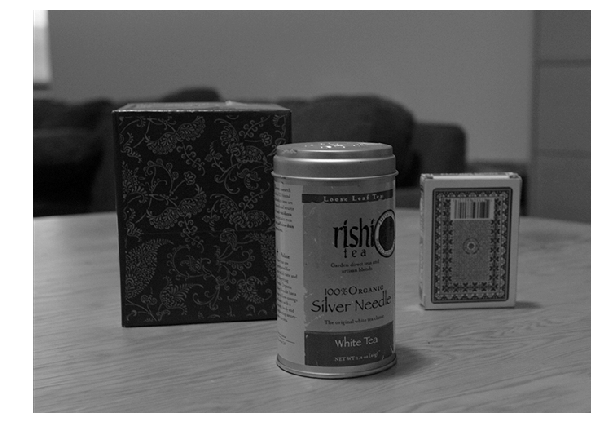

In [68]:
from utils import animated_scatter
from motion import track_features
keypoints = corner_peaks(corner_harris(frames[0]),
                         exclude_border=5,
                         threshold_rel=0.01)

trajs = track_features(frames, keypoints,
                       error_thresh=1.5,
                       optflow_fn=pyramid_lucas_kanade,
                       window_size=5)
ani = animated_scatter(frames,trajs)
HTML(ani.to_html5_video())

## 4. Object Tracking
Let us build a simple object tracker using the Lucas-Kanade method we have implemented in previous sections. In order to test the object tracker, we provide you a short face-tracking sequence. Each frame in the sequence is annotated with the ground-truth location (as bounding box) of face.

An object tracker is given an object bounding box in the first frame, and it has to track the object by predicting bounding boxes in subsequent frames.

c:\users\yingchen\anaconda3\envs\assign3\lib\site-packages\skimage\io\_io.py:49: UserWarning: `as_grey` has been deprecated in favor of `as_gray`
  warn('`as_grey` has been deprecated in favor of `as_gray`')


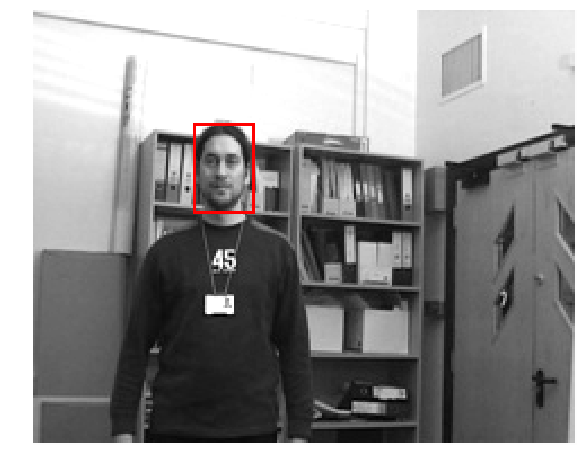

In [50]:
from utils import animated_bbox, load_bboxes

# Load frames and ground truth bounding boxes
frames_test = load_frames('Man/img')
gt_bboxes = load_bboxes('Man/groundtruth_rect.txt')

ani = animated_bbox(frames_test, gt_bboxes)
HTML(ani.to_html5_video())

In order to track the object, we first find keypoints to track inside the bounding box. Then, we track those points in each of the following frames and output a tight bounding box around the tracked points. In order to prevent all the keypoints being lost, we detect new keypoints within the bounding box every 20 frames.

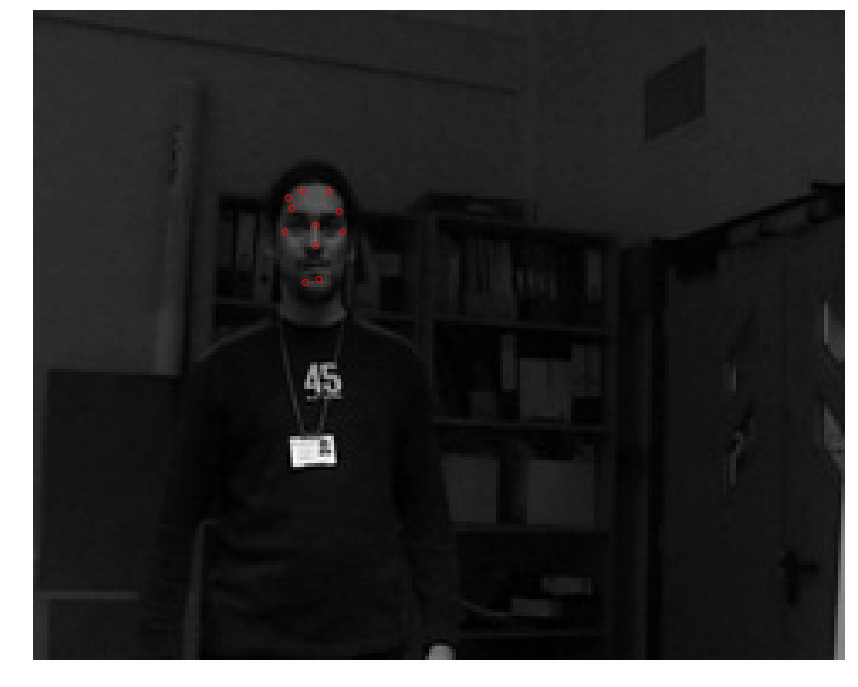

In [99]:
# Find features to track within the bounding box
x, y, w, h = gt_bboxes[0]
roi = frames_test[0][y:y+h, x:x+w]
keypoints = corner_peaks(corner_harris(roi),
                         exclude_border=2,
                         threshold_rel=0.0000000001)

# Shift keypoints by bbox offset
keypoints[:,1] += x
keypoints[:,0] += y

# Plot kepoints
plt.figure(figsize=(15,12))
plt.imshow(frames_test[0])
plt.scatter(keypoints[:,1], keypoints[:,0],
            facecolors='none', edgecolors='r')
plt.axis('off')
plt.show()

In [125]:
from motion import compute_error

# Initailze keypoints abd bounding box
kp_I = keypoints
x, y, w, h = gt_bboxes[0]
bboxes = [(x, y, w, h)]

#####################################################
n_frames = 3
exclude_border_value=3
threshold_rel_value=0.001
# You may modify the code below to use the params you
# define above.
#####################################################



for i in range(len(frames_test)-1):
    I = frames_test[i] # current frame
    J = frames_test[i+1] # next frame
    
    # estimate keypoints in frame J
    flow_vectors = pyramid_lucas_kanade(I, J, kp_I)
    kp_J = kp_I + flow_vectors
    
    # Leave out lost points
    new_keypoints = []
    for yi, xi, yj, xj in np.hstack((kp_I, kp_J)):
        if yj > J.shape[0]-2 or yj < 1 or xj > J.shape[1]-2 or xj < 1:
            print('out of bound')
            continue
        else:
            patch_I = I[int(yi)-1:int(yi)+2, int(xi)-1:int(xi)+2]
            patch_J = J[int(yj)-1:int(yj)+2, int(xj)-1:int(xj)+2]
            error = compute_error(patch_I, patch_J)
            if error > 3.0:
                continue
            else:
                new_keypoints.append([yj, xj])
    
    # Update keypoints
    kp_I = np.array(new_keypoints)
    
    # Find bounding box around the keypoints
   
    if len(kp_I) > 0:
        x_center = int(np.mean(kp_I[:,1]))
        y_center = int(np.mean(kp_I[:,0]))
        x = int(x_center-w/2.0)
        y = int(y_center-h/2.0)
        #x = int(kp_I[:,1].min())
        #y = int(kp_I[:,0].min())
        #w = int(kp_I[:,1].max()) - x
        #h = int(kp_I[:,0].max()) - y
    else:
        (x, y, w, h) = (0, 0, 0, 0)
    bboxes.append((x,y,w,h))

    # Refresh keypoints every 10 frames
    if (i+1) % n_frames == 0 and (w * h > 0):
        roi = J[y:y+h, x:x+w]
        new_keypoints = corner_peaks(corner_harris(roi),
                                 exclude_border=exclude_border_value,
                                 threshold_rel=threshold_rel_value)
        new_keypoints[:,1] += x
        new_keypoints[:,0] += y
        kp_I = np.vstack((kp_I, new_keypoints))

out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound
out of bound


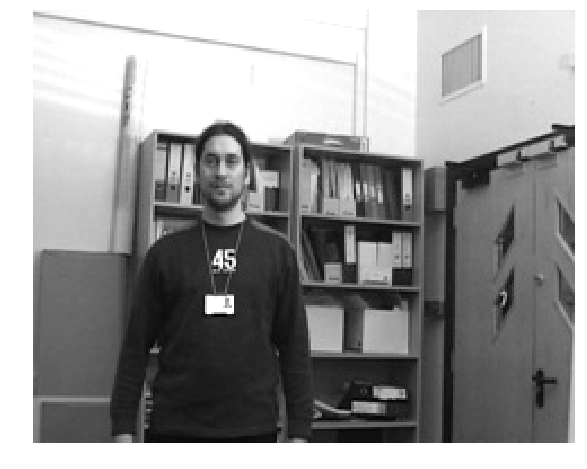

In [126]:
ani = animated_bbox(frames_test, bboxes)
#ani.save("test.mp4")
HTML(ani.to_html5_video())

### 4.1 Evaluating Object Tracker: intersection over union (IoU)
Intersection over union is a common metric for evaluating performance of an object tracker. With default parameters, you will get IoU score of ~0.19. Optimize object tracker in the code cell below. You may modify the code and define new parameters. You will full marks for IoU score > 0.35.

In [127]:
from motion import IoU  

average_iou = 0.0
for gt_bbox, bbox in zip(gt_bboxes, bboxes):
    average_iou += IoU(gt_bbox, bbox)
    
average_iou /= len(gt_bboxes)
print(average_iou)

0.16730694683759925


# Final submission instructions
Please submit the following:

1) Keep the structure of all files in this folder the same as what we have provided. 
Please zip up the following folders under a folder named with your Student ID: eg. `A0123456.zip` and submit the zipped folder to LumiNUS.
If unzip the file, the structure should be like this:

```bash
A0123456/
  Assignment-5/
    Assignment-5/
        Assignment 5.ipynb
        motion.py
        ..
```